In [1]:
import earthaccess
import os
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
import rioxarray as rxr
import geojson
import geopandas as gp
import rasterio
# from utils import filter_and_order_bands, extract_dataset, load_bands_and_cdl

In [2]:
earthaccess.login(persist=True)

In [47]:
# Polygon coordinates
polygon_str = "41.4363364 -96.4888634 42.4243141 -96.4497871 42.4462409 -97.784003 41.4575202 -97.802654 41.4363364 -96.4888634"

# Split the string into individual latitude and longitude pairs
coords = polygon_str.split()

# Separate latitudes and longitudes
latitudes = [float(coords[i]) for i in range(0, len(coords), 2)]
longitudes = [float(coords[i + 1]) for i in range(0, len(coords), 2)]

# Calculate the bounding box
min_lat = min(latitudes)
max_lat = max(latitudes)
min_lon = min(longitudes)
max_lon = max(longitudes)

# Resulting bounding box for earthaccess.search_data
bbox = (min_lon, min_lat, max_lon, max_lat)
print("Bounding Box:", bbox)

# bbox = (-92.7607592, 41.4562419, -91.0651084, 41.9508592)
temporal = ("2022-06-01", "2022-09-01")

results = earthaccess.search_data(
    short_name=['HLSL30', 'HLSS30'],
    bounding_box=bbox,
    temporal=temporal,
    cloud_cover=(0, 0.01)
)

meta_df = pd.json_normalize(results)

Bounding Box: (-97.802654, 41.4363364, -96.4497871, 42.4462409)


In [49]:
meta_df['result_index'] = meta_df.index

# Define the specific tile name
tile_name = 'T14TPM'
meta_df = meta_df[meta_df['meta.native-id'].str.split('.').str[2] == tile_name]

# Extract the Julian date by accessing the specific position
date_strings = meta_df['meta.native-id'].str.split('.').str[3].str[:7]

# Convert the Julian date to datetime format
meta_df.loc[:, 'acquisition_date'] = pd.to_datetime(date_strings, format='%Y%j')

# Sort by the acquisition date
meta_df = meta_df.sort_values(by='acquisition_date').reset_index(drop=True)

# Retrieve corresponding elements from `results`
results = [results[i] for i in meta_df['result_index']]

assert len(results) == len(meta_df)

In [59]:
native_id = 'HLS.S30.T14TPM.2022167T171911.v2.0'
native_id = 'HLS.S30.T14TPM.2022202T171859.v2.0'
native_id = 'HLS.S30.T14TPM.2022242T171859.v2.0'

In [60]:
granule_idx = meta_df[meta_df['meta.native-id'] == native_id].index[0]
results[granule_idx]

Collection: {'EntryTitle': 'HLS Sentinel-2 Multi-spectral Instrument Surface Reflectance Daily Global 30m v2.0'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Longitude': -96.48886345, 'Latitude': 41.43633638}, {'Longitude': -96.44978707, 'Latitude': 42.42431414}, {'Longitude': -97.78400298, 'Latitude': 42.44624086}, {'Longitude': -97.80265404, 'Latitude': 41.45752019}, {'Longitude': -96.48886345, 'Latitude': 41.43633638}]}}]}}}
Temporal coverage: {'RangeDateTime': {'BeginningDateTime': '2022-08-30T17:32:12.459Z', 'EndingDateTime': '2022-08-30T17:32:12.459Z'}}
Size(MB): 210.14604949951172
Data: ['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.VAA.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.SAA.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B06.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B08.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B04.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B02.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B8A.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B03.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.VZA.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.SZA.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.Fmask.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B12.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B05.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B09.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B11.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B01.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B07.tif', 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T14TPM.2022242T171859.v2.0/HLS.S30.T14TPM.2022242T171859.v2.0.B10.tif']

In [61]:
granule = results[granule_idx]
# dataset_name = extract_dataset(meta_df['meta.native-id'][granule_idx])
band_urls = granule.data_links()

fmask_link = [url for url in band_urls if url.endswith("Fmask.tif")][0]

In [62]:
fs = earthaccess.get_fsspec_https_session()

In [63]:
# Create a directory to store the bands
output_dir = "raw_data/nebraska/patch1/{}".format(native_id)
os.makedirs(output_dir, exist_ok=True)

# Download all bands
for url in band_urls:
    # Extract band name from URL
    band_name = url.split('.')[-2]  # This will get B01, B02, etc.
    output_path = os.path.join(output_dir, f"{band_name}.tif")
    
    # Download the band
    with fs.open(url, 'rb') as src:
        with open(output_path, 'wb') as dst:
            dst.write(src.read())
    
    print(f"Downloaded {band_name}")

print("All bands downloaded successfully!")

Downloaded VAA
Downloaded SAA
Downloaded B06
Downloaded B08
Downloaded B04
Downloaded B02
Downloaded B8A
Downloaded B03
Downloaded VZA
Downloaded SZA
Downloaded Fmask
Downloaded B12
Downloaded B05
Downloaded B09
Downloaded B11
Downloaded B01
Downloaded B07
Downloaded B10
All bands downloaded successfully!


In [21]:
# import rasterio
# import matplotlib.pyplot as plt
# import numpy as np

# # Load a band from your local directory
# band_path = "raw_data/IOWA/patch1/HLS.S30.T14UMU.2022243T173921.v2.0/B04.tif"  # Replace with your actual path
# with rasterio.open(band_path) as src:
#     band = src.read(1) * 0.0001  # Read first band and apply scaling factor

# # Plot the band
# plt.figure(figsize=(12, 12))
# plt.imshow(band, cmap='RdYlBu_r')
# plt.colorbar(label='Surface Reflectance')
# plt.title('Red Band (B04)')
# plt.show()

# # Print some basic statistics
# print(f"Mean reflectance: {band.mean():.4f}")
# print(f"Min reflectance: {band.min():.4f}")
# print(f"Max reflectance: {band.max():.4f}")

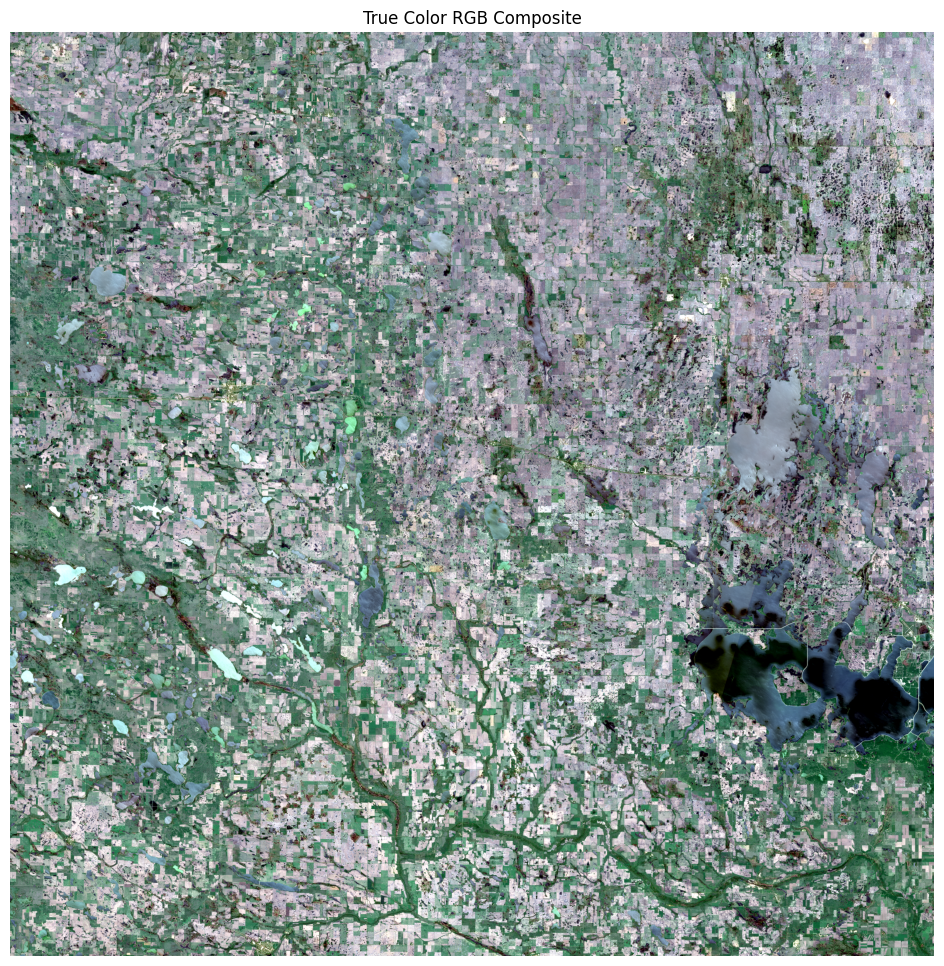

Band Statistics:
Red band - Mean: 0.4968, Min: 0.0000, Max: 1.0000
Green band - Mean: 0.5567, Min: 0.0000, Max: 1.0000
Blue band - Mean: 0.5428, Min: 0.0000, Max: 1.0000


In [5]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np


def stretch_contrast(band, lower_percent=1, upper_percent=99):
    """Stretch the contrast of a band using percentiles"""
    min_val = np.percentile(band, lower_percent)
    max_val = np.percentile(band, upper_percent)
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

def apply_gamma_correction(band, gamma=0.8):
    """Apply gamma correction to brighten dark areas"""
    return np.power(band, gamma)

path = "raw_data/North Dakota/patch1/HLS.S30.T14UMU.2022168T173909.v2.0"
# Load the RGB bands
with rasterio.open('{}/B04.tif'.format(path)) as src:  # Red band
    red = src.read(1) * 0.0001
with rasterio.open('{}/B03.tif'.format(path)) as src:  # Green band
    green = src.read(1) * 0.0001
with rasterio.open('{}/B02.tif'.format(path)) as src:  # Blue band
    blue = src.read(1) * 0.0001


# Apply contrast stretching with wider percentiles
red = stretch_contrast(red, lower_percent=1, upper_percent=99)
green = stretch_contrast(green, lower_percent=1, upper_percent=99)
blue = stretch_contrast(blue, lower_percent=1, upper_percent=99)

# Apply gamma correction
red = apply_gamma_correction(red, gamma=0.8)
green = apply_gamma_correction(green, gamma=0.8)
blue = apply_gamma_correction(blue, gamma=0.8)


# Stack the bands to create RGB composite
rgb = np.dstack((red, green, blue))

# Plot the RGB composite
plt.figure(figsize=(12, 12))
plt.imshow(rgb)
plt.title('True Color RGB Composite')
plt.axis('off')  # Hide axes
plt.show()

# Print some basic statistics
print("Band Statistics:")
print(f"Red band - Mean: {red.mean():.4f}, Min: {red.min():.4f}, Max: {red.max():.4f}")
print(f"Green band - Mean: {green.mean():.4f}, Min: {green.min():.4f}, Max: {green.max():.4f}")
print(f"Blue band - Mean: {blue.mean():.4f}, Min: {blue.min():.4f}, Max: {blue.max():.4f}")

In [5]:
red.size // (224 * 224)

266

In [111]:
def get_band(band_link, is_fmask=False):
    with rasterio.open(fs.open(band_link)) as raster:
        if is_fmask:
            band = raster.read(1, masked=True)
        else:
            band = raster.read(1, masked=True) * 0.0001
        return band

band = get_band(fmask_link, is_fmask=True)
# band = get_band(band_urls[1], is_fmask=False)

In [112]:

# band_link = fmask_band
# with rasterio.open(fs.open(band_link)) as raster:
#     crs = raster.crs.to_epsg() or raster.crs.to_wkt() or raster.crs.to_proj4()
#     transform = raster.transform
#     # band = raster.read(1, masked=True) * 0.0001
#     band = raster.read(1, masked=True)

In [113]:
def detect_cloud_issues(fmask_array):
    """
    Identifies pixels that have Cloud, Adjacent to cloud/shadow, Cloud shadow, or Snow/ice.
    
    Parameters:
        fmask_array (numpy.ndarray): A 2D array representing the Fmask band.
    
    Returns:
        numpy.ndarray: A boolean mask where True indicates the presence of any of the specified conditions.
    """
    # Extract bits using bitwise operations
    cloud = (fmask_array & (1 << 1)) > 0  # Bit 1
    adjacent_to_cloud = (fmask_array & (1 << 2)) > 0  # Bit 2
    cloud_shadow = (fmask_array & (1 << 3)) > 0  # Bit 3
    snow_ice = (fmask_array & (1 << 4)) > 0  # Bit 4
    
    # Combine all conditions
    return cloud | adjacent_to_cloud | cloud_shadow | snow_ice


In [114]:
fmask_array = band.data
np.sum((fmask_array & (1 << 1)) > 0) / fmask_array.size
np.sum(detect_cloud_issues(fmask_array)) / fmask_array.size

np.float64(0.0002669533279584341)

Mean: 0.2740534234778938
Min: 0.18460000000000001
Max: 0.38570000000000004


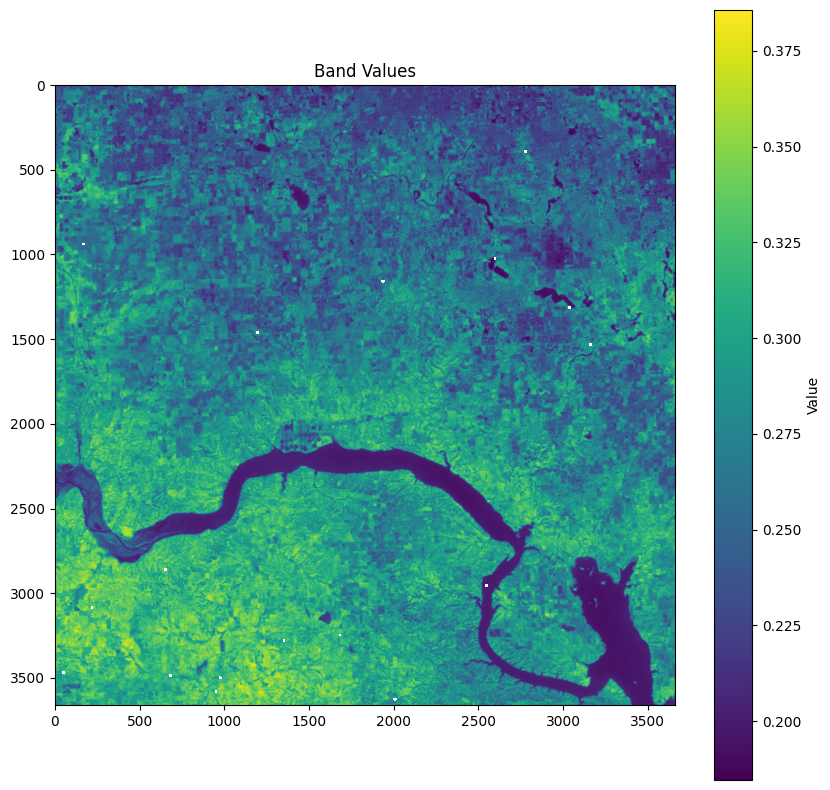

In [110]:
import matplotlib.pyplot as plt
import numpy as np

# Get basic statistics (ignoring masked values)
print(f"Mean: {band.mean()}")
print(f"Min: {band.min()}")
print(f"Max: {band.max()}")

# Create a simple visualization
plt.figure(figsize=(10, 10))
plt.imshow(band)
plt.colorbar(label='Value')
plt.title('Band Values')
plt.show()

In [ ]:
import rasterio

# Open the TIFF filehttps://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSS30.020/HLS.S30.T13UGP.2023243T173909.v2.0/HLS.S30.T13UGP.2023243T173909.v2.0.VZA.tif
with rasterio.open('path/to/your/file.tif') as src:
    # Read the data into a numpy array
    tiff_data = src.read()  # reads all bands
    # Or read specific band (band numbers start at 1)
    # tiff_data = src.read(1)  # reads first band only
    
    # Get metadata if needed
    metadata = src.meta

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def load_cdl(file_path):
    """
    Load the Cropland Data Layer (CDL) from a GeoTIFF file.
    
    Args:
        file_path (str): Path to the CDL GeoTIFF file
    
    Returns:
        dataset: The opened rasterio dataset
        image: The CDL data as a numpy array
    """
    # Open the GeoTIFF file
    with rasterio.open(file_path) as dataset:
        # Read the data
        image = dataset.read(1)  # Read the first band
        
        # Print basic information about the dataset
        print(f"Dataset dimensions: {image.shape}")
        print(f"Coordinate system: {dataset.crs}")
        print(f"Transform: {dataset.transform}")
        
        return dataset, image

def plot_cdl(image, title="Cropland Data Layer"):
    """
    Plot the CDL data using matplotlib.
    
    Args:
        image (numpy.ndarray): The CDL data array
        title (str): Title for the plot
    """
    plt.figure(figsize=(12, 8))
    plt.imshow(image, cmap='tab20')  # Using tab20 colormap for discrete classes
    plt.colorbar(label='Land Cover Class')
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
# Path to your CDL file
cdl_path = "raw_data/cdl_2022/2022_30m_cdls.tif"

# Load the data
dataset, cdl_data = load_cdl(cdl_path)

# Plot the data
# plot_cdl(cdl_data)

# Print some basic statistics
print("\nBasic Statistics:")
print(f"Minimum value: {np.min(cdl_data)}")
print(f"Maximum value: {np.max(cdl_data)}")
print(f"Number of unique classes: {len(np.unique(cdl_data))}")

Dataset dimensions: (96523, 153811)
Coordinate system: EPSG:5070
Transform: | 30.00, 0.00,-2356095.00|
| 0.00,-30.00, 3172605.00|
| 0.00, 0.00, 1.00|

Basic Statistics:
Minimum value: 0
Maximum value: 254


In [1]:
import rasterio
from rasterio.errors import RasterioIOError

def get_cdl_metadata(file_path):
    """
    Extract and display metadata from the CDL layer.
    """
    try:
        with rasterio.open(file_path) as dataset:
            print("CDL Layer Metadata:")
            print("-" * 50)
            
            # Basic raster information
            print("\nBasic Information:")
            print(f"Driver: {dataset.driver}")
            print(f"Width: {dataset.width} pixels")
            print(f"Height: {dataset.height} pixels")
            print(f"Number of bands: {dataset.count}")
            print(f"Data type: {dataset.dtypes[0]}")
            
            # Coordinate system
            print("\nCoordinate System:")
            print(f"CRS: {dataset.crs}")
            
            # Geographic bounds
            bounds = dataset.bounds
            print("\nGeographic Bounds:")
            print(f"Left: {bounds.left}")
            print(f"Bottom: {bounds.bottom}")
            print(f"Right: {bounds.right}")
            print(f"Top: {bounds.top}")
            
            # Resolution
            print("\nResolution:")
            print(f"X resolution: {dataset.res[0]} units")
            print(f"Y resolution: {dataset.res[1]} units")
            
            # Transform
            print("\nTransform:")
            print(dataset.transform)
            
            # Tags and metadata
            print("\nTags:")
            for key, value in dataset.tags().items():
                print(f"{key}: {value}")
            
            # Band-specific metadata
            print("\nBand 1 Metadata:")
            for key, value in dataset.tags(1).items():
                print(f"{key}: {value}")
            
    except RasterioIOError as e:
        print(f"Error opening the file: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")

# Use the function with your CDL file
cdl_path = "raw_data/cdl_2022/2022_30m_cdls.tif"
get_cdl_metadata(cdl_path)

CDL Layer Metadata:
--------------------------------------------------

Basic Information:
Driver: GTiff
Width: 153811 pixels
Height: 96523 pixels
Number of bands: 1
Data type: uint8

Coordinate System:
CRS: EPSG:5070

Geographic Bounds:
Left: -2356095.0
Bottom: 276915.0
Right: 2258235.0
Top: 3172605.0

Resolution:
X resolution: 30.0 units
Y resolution: 30.0 units

Transform:
| 30.00, 0.00,-2356095.00|
| 0.00,-30.00, 3172605.00|
| 0.00, 0.00, 1.00|

Tags:
TIFFTAG_SOFTWARE: E
TIFFTAG_XRESOLUTION: 1
TIFFTAG_YRESOLUTION: 1
TIFFTAG_RESOLUTIONUNIT: 2 (pixels/inch)
AREA_OR_POINT: Area

Band 1 Metadata:
LAYER_TYPE: thematic
STATISTICS_EXCLUDEDVALUES: 0
STATISTICS_HISTOBINVALUES: 0|408455556|68254683|10529500|37000448|399060594|6915581|0|0|0|6620960|452471|1128854|750225|236947|0|0|0|0|0|0|11879173|6844898|55640369|124959135|67280|17681658|3297035|7768827|4269469|19490|9992854|1149398|980087|3762|1217313|92115381|123210988|45342|88600|0|5155064|5754162|4701050|309411|5179343|502503|314544|1479

In [1]:
import os
import rasterio
from rasterio.errors import RasterioIOError
from pathlib import Path

def get_tiff_metadata(directory):
    """
    Scan through all TIFF files in a directory and extract their metadata.
    
    Args:
        directory (str): Path to the directory containing TIFF files
    """
    # Get all .tif files in the directory and subdirectories
    tiff_files = list(Path(directory).rglob("*.tif"))
    
    if not tiff_files:
        print(f"No TIFF files found in {directory}")
        return
    
    print(f"Found {len(tiff_files)} TIFF files\n")
    
    for tiff_path in tiff_files:
        try:
            with rasterio.open(tiff_path) as dataset:
                print(f"\nFile: {tiff_path}")
                print("-" * 50)
                
                # Basic information
                print(f"Driver: {dataset.driver}")
                print(f"Dimensions: {dataset.width}x{dataset.height} pixels")
                print(f"Number of bands: {dataset.count}")
                
                # Coordinate system
                print(f"CRS: {dataset.crs}")
                if dataset.crs:
                    print(f"EPSG: {dataset.crs.to_epsg()}")
                
                # Resolution
                print(f"Resolution: {dataset.res}")
                
                # Geographic bounds
                bounds = dataset.bounds
                print(f"Bounds: {bounds}")
                
                # Data type
                print(f"Data type: {dataset.dtypes[0]}")
                
        except RasterioIOError as e:
            print(f"Error reading {tiff_path}: {e}")
        except Exception as e:
            print(f"An error occurred with {tiff_path}: {e}")

# Use the function with your raw_data directory
raw_data_path = "raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/"
get_tiff_metadata(raw_data_path)

Found 18 TIFF files


File: raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/SZA.tif
--------------------------------------------------
Driver: GTiff
Dimensions: 3660x3660 pixels
Number of bands: 1
CRS: EPSG:32616
EPSG: 32616
Resolution: (30.0, 30.0)
Bounds: BoundingBox(left=199980.0, bottom=4490220.0, right=309780.0, top=4600020.0)
Data type: uint16

File: raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/B09.tif
--------------------------------------------------
Driver: GTiff
Dimensions: 3660x3660 pixels
Number of bands: 1
CRS: EPSG:32616
EPSG: 32616
Resolution: (30.0, 30.0)
Bounds: BoundingBox(left=199980.0, bottom=4490220.0, right=309780.0, top=4600020.0)
Data type: int16

File: raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/B10.tif
--------------------------------------------------
Driver: GTiff
Dimensions: 3660x3660 pixels
Number of bands: 1
CRS: EPSG:32616
EPSG: 32616
Resolution: (30.0, 30.0)
Bounds: BoundingBox(left=199980.0, bottom=4490220.0, 

In [2]:
import os
from pathlib import Path
import rasterio
from rasterio.errors import RasterioIOError

def get_hls_epsg_codes(base_dir):
    """
    Scan through all state folders and their HLS data patches to get EPSG codes.
    
    Args:
        base_dir (str): Path to the raw_data directory
    """
    # Get all state directories
    state_dirs = [d for d in Path(base_dir).iterdir() if d.is_dir() and d.name != 'cdl_2022']
    
    for state_dir in state_dirs:
        print(f"\nState: {state_dir.name}")
        print("=" * 50)
        
        # Find all .tif files in the state directory
        tiff_files = list(state_dir.rglob("*.tif"))
        
        if not tiff_files:
            print(f"No TIFF files found in {state_dir.name}")
            continue
            
        print(f"Found {len(tiff_files)} TIFF files")
        
        # Dictionary to store unique EPSG codes
        epsg_codes = {}
        
        for tiff_path in tiff_files:
            try:
                with rasterio.open(tiff_path) as dataset:
                    epsg = dataset.crs.to_epsg()
                    if epsg:
                        epsg_codes[epsg] = epsg_codes.get(epsg, 0) + 1
                        
            except RasterioIOError as e:
                print(f"Error reading {tiff_path.name}: {e}")
            except Exception as e:
                print(f"An error occurred with {tiff_path.name}: {e}")
        
        # Print summary for this state
        if epsg_codes:
            print("\nEPSG codes found:")
            for epsg, count in epsg_codes.items():
                print(f"EPSG:{epsg}: {count} files")
        else:
            print("No valid EPSG codes found")
        
        print("-" * 50)

# Use the function with your raw_data directory
raw_data_path = "raw_data"
get_hls_epsg_codes(raw_data_path)


State: nebraska
Found 54 TIFF files

EPSG codes found:
EPSG:32614: 54 files
--------------------------------------------------

State: IOWA
Found 54 TIFF files

EPSG codes found:
EPSG:32615: 54 files
--------------------------------------------------

State: North Dakota
Found 153 TIFF files

EPSG codes found:
EPSG:32614: 54 files
EPSG:32613: 99 files
--------------------------------------------------

State: illinois
Found 54 TIFF files

EPSG codes found:
EPSG:32616: 54 files
--------------------------------------------------


In [2]:
import os
from pathlib import Path
import rasterio
import numpy as np
from rasterio.errors import RasterioIOError

def analyze_missing_data(base_dir):
    """
    Analyze the amount of missing data in each HLS patch.
    
    Args:
        base_dir (str): Path to the raw_data directory
    """
    # Get all state directories
    state_dirs = [d for d in Path(base_dir).iterdir() if d.is_dir() and d.name != 'cdl_2022']
    
    for state_dir in state_dirs:
        print(f"\nState: {state_dir.name}")
        print("=" * 60)
        
        # Find all .tif files in the state directory
        tiff_files = list(state_dir.rglob("*.tif"))
        
        if not tiff_files:
            print(f"No TIFF files found in {state_dir.name}")
            continue
            
        print(f"Found {len(tiff_files)} TIFF files")
        print("\nPatch Analysis:")
        print("-" * 60)
        print(f"{'Patch Name':<30} {'Total Pixels':<15} {'Missing Pixels':<15} {'Missing %':<10}")
        print("-" * 60)
        
        for tiff_path in tiff_files:
            try:
                with rasterio.open(tiff_path) as dataset:
                    
                    # Read all bands
                    data = dataset.read()
                    
                    # Calculate total pixels (excluding the mask band if present)
                    total_pixels = data[0].size

                    # Count missing data (NaN or 0 values)
                    # Determine missing value based on file type
                    missing_val = 255 if str(tiff_path).endswith("Fmask.tif") else -9999
                    
                    missing_pixels = np.sum(data[0] == missing_val)
                    missing_percentage = (missing_pixels / total_pixels) * 100
                    
                    # Print results for this patch
                    print(f"{tiff_path.name[:30]:<30} {total_pixels:<15} {missing_pixels:<15} {missing_percentage:>6.2f}%")
                    
            except RasterioIOError as e:
                print(f"Error reading {tiff_path.name}: {e}")
            except Exception as e:
                print(f"An error occurred with {tiff_path.name}: {e}")
        
        print("-" * 60)

# Use the function with your raw_data directory
raw_data_path = "raw_data"
analyze_missing_data(raw_data_path)


State: nebraska
Found 54 TIFF files

Patch Analysis:
------------------------------------------------------------
Patch Name                     Total Pixels    Missing Pixels  Missing % 
------------------------------------------------------------
SZA.tif                        13395600        0                 0.00%
B09.tif                        13395600        8                 0.00%
B10.tif                        13395600        8                 0.00%
B06.tif                        13395600        8                 0.00%
B07.tif                        13395600        8                 0.00%
VZA.tif                        13395600        0                 0.00%
B11.tif                        13395600        8                 0.00%
Fmask.tif                      13395600        8                 0.00%
B08.tif                        13395600        8                 0.00%
B02.tif                        13395600        8                 0.00%
B12.tif                        13395600 

In [1]:
from utils import load_two_bands

In [34]:
path1 = './raw_data/North Dakota/patch1/HLS.L30.T13UFP.2022173T174118.v2.0'
path2 = './raw_data/North Dakota/patch1/HLS.L30.T13UFP.2022197T174055.v2.0'
rast1, rast2 = load_two_bands(path1, path2, band1='B02', band2='B02')

In [41]:
row, col = 394, 331
utmx, utmy = rast1.xy(row, col)
row1, col1 = rast2.index(utmx, utmy)

In [42]:
row1, col1

(394, 331)

In [2]:
import rasterio
band_path = './raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/B01.tif'

with rasterio.open(band_path) as src:
        data = src.read(1)
        metadata = {
            'crs': src.crs,
            'transform': src.transform,
            'width': src.width,
            'height': src.height,
            'bounds': src.bounds
        }

In [4]:
metadata['bounds']

BoundingBox(left=199980.0, bottom=4490220.0, right=309780.0, top=4600020.0)

In [5]:
metadata['transform']

Affine(30.0, 0.0, 199980.0,
       0.0, -30.0, 4600020.0)

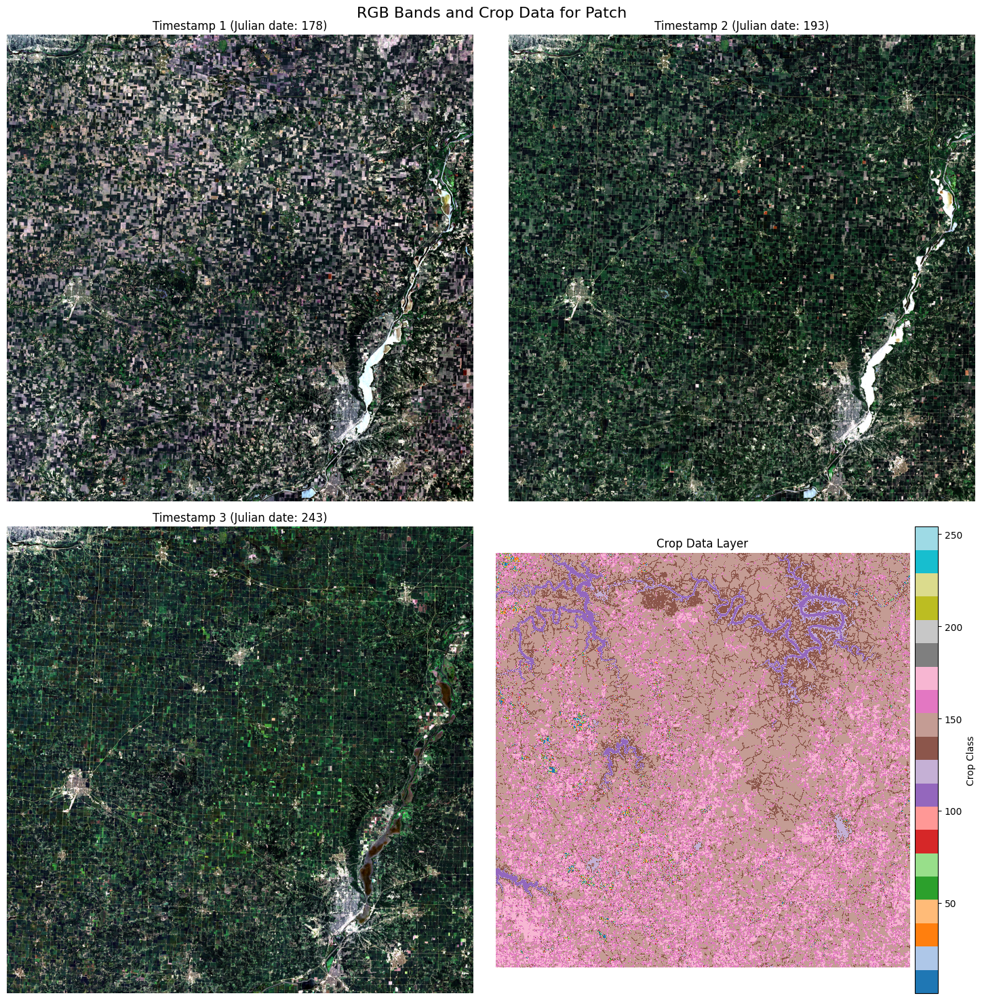

Stacked data shape: (19, 3660, 3660)
Unique crop classes: [  1   4   5   6  12  13  21  24  26  27  28  29  36  37  44  58  59  60
  61  68  74 111 121 122 123 124 131 141 142 143 152 176 190 195 205 225
 236 242 254]
Number of unique crop classes: 39

Crop class distribution:
Class 1: 48947 pixels (0.37%)
Class 4: 4673 pixels (0.03%)
Class 5: 104366 pixels (0.78%)
Class 6: 4 pixels (0.00%)
Class 12: 2 pixels (0.00%)
Class 13: 9 pixels (0.00%)
Class 21: 2 pixels (0.00%)
Class 24: 5826 pixels (0.04%)
Class 26: 11724 pixels (0.09%)
Class 27: 94 pixels (0.00%)
Class 28: 118 pixels (0.00%)
Class 29: 82 pixels (0.00%)
Class 36: 15535 pixels (0.12%)
Class 37: 324782 pixels (2.42%)
Class 44: 129 pixels (0.00%)
Class 58: 161 pixels (0.00%)
Class 59: 1886 pixels (0.01%)
Class 60: 1 pixels (0.00%)
Class 61: 1488 pixels (0.01%)
Class 68: 7 pixels (0.00%)
Class 74: 814 pixels (0.01%)
Class 111: 519307 pixels (3.88%)
Class 121: 475178 pixels (3.55%)
Class 122: 252751 pixels (1.89%)
Class 123: 85840

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
import os

# Function to normalize data for visualization
def normalize_band(band, lower_percentile=2, upper_percentile=98):
    """Normalize band data for visualization using percentiles"""
    min_val = np.percentile(band, lower_percentile)
    max_val = np.percentile(band, upper_percentile)
    normalized = np.clip((band - min_val) / (max_val - min_val), 0, 1)
    return normalized

# Function to create RGB composite
def create_rgb_composite(red_band, green_band, blue_band, lower_percentile=2, upper_percentile=98):
    """Create RGB composite from three bands"""
    r = normalize_band(red_band, lower_percentile, upper_percentile)
    g = normalize_band(green_band, lower_percentile, upper_percentile)
    b = normalize_band(blue_band, lower_percentile, upper_percentile)
    return np.dstack((r, g, b))

# Function to plot crop data with custom colormap
def plot_crop_data(crop_data, ax, title="Crop Data Layer"):
    """Plot crop data with a custom colormap"""
    # Create a custom colormap for crop data
    # This is a simplified version - you might want to customize based on your crop classes
    cmap = plt.cm.tab20
    norm = mcolors.Normalize(vmin=np.min(crop_data), vmax=np.max(crop_data))
    
    im = ax.imshow(crop_data, cmap=cmap, norm=norm)
    ax.set_title(title)
    ax.axis('off')
    
    # Add a colorbar
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.01)
    cbar.set_label('Crop Class')
    
    return im

# Load the stacked data
patch_path = "processed_data/illinois/patch1"  # Change this to your patch path
stacked_data_path = os.path.join(patch_path, "all_bands_stacked.npy")
metadata_path = os.path.join(patch_path, "metadata.txt")

# Load the stacked data
stacked_data = np.load(stacked_data_path)

# Extract RGB bands for each timestamp
# Based on the metadata, bands are organized as:
# B02 (Blue), B03 (Green), B04 (Red) for each timestamp

# Timestamp 1 (index 0-5)
rgb1 = create_rgb_composite(
    stacked_data[2],  # B04 (Red)
    stacked_data[1],  # B03 (Green)
    stacked_data[0]   # B02 (Blue)
)

# Timestamp 2 (index 6-11)
rgb2 = create_rgb_composite(
    stacked_data[8],  # B04 (Red)
    stacked_data[7],  # B03 (Green)
    stacked_data[6]   # B02 (Blue)
)

# Timestamp 3 (index 12-17)
rgb3 = create_rgb_composite(
    stacked_data[14],  # B04 (Red)
    stacked_data[13],  # B03 (Green)
    stacked_data[12]   # B02 (Blue)
)

# Crop data is the last band (index 18)
crop_data = stacked_data[18]

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle("RGB Bands and Crop Data for Patch", fontsize=16)

# Plot RGB composites for each timestamp
axes[0, 0].imshow(rgb1)
axes[0, 0].set_title("Timestamp 1 (Julian date: 178)")
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb2)
axes[0, 1].set_title("Timestamp 2 (Julian date: 193)")
axes[0, 1].axis('off')

axes[1, 0].imshow(rgb3)
axes[1, 0].set_title("Timestamp 3 (Julian date: 243)")
axes[1, 0].axis('off')

# Plot crop data
plot_crop_data(crop_data, axes[1, 1], "Crop Data Layer")

plt.tight_layout()
plt.show()

# Print some statistics about the data
print(f"Stacked data shape: {stacked_data.shape}")
print(f"Unique crop classes: {np.unique(crop_data)}")
print(f"Number of unique crop classes: {len(np.unique(crop_data))}")

# Optional: Print the crop class distribution
unique, counts = np.unique(crop_data, return_counts=True)
print("\nCrop class distribution:")
for u, c in zip(unique, counts):
    print(f"Class {u}: {c} pixels ({c/crop_data.size*100:.2f}%)")

In [12]:
# import rasterio
# from rasterio.merge import merge
# from rasterio.plot import show
# import glob

# # Step 1: List the CDL files you downloaded
# cdl_files = [
#     "cdl_data/IOWA/clipped.TIF",
#     "cdl_data/illinoise/clipped.TIF",
#     "cdl_data/nebraska/clipped.TIF",
#     "cdl_data/North Dakota/clipped.TIF"
# ]

# src_files_to_mosaic = [rasterio.open(fp) for fp in cdl_files]

# # Step 2: Merge the rasters
# mosaic, out_transform = merge(src_files_to_mosaic)

# Step 3: Save the result to a new file
out_meta = src_files_to_mosaic[0].meta.copy()
out_meta.update({
    "driver": "GTiff",
    "height": mosaic.shape[1],
    "width": mosaic.shape[2],
    "transform": out_transform
})

with rasterio.open("cdl_2022_combined.tif", "w", **out_meta) as dest:
    dest.write(mosaic)


In [3]:
src_files_to_mosaic[0]

<open DatasetReader name='cdl_data/IOWA/clipped.TIF' mode='r'>

In [ ]:
from rasterio.plot import show
import matplotlib.pyplot as plt
# Plot the mosaic
plt.figure(figsize=(12, 10))
show(mosaic[0], transform=out_transform, cmap='tab20')  # CDL is a single band
plt.title("Merged CDL Mosaic (2022)")
plt.axis('off')
plt.show()


In [3]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from shapely.geometry import box
import geopandas as gpd  # We might still use it for bounding box operations

# Paths to your raster files
red_band_path = "./raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/B04.tif"
crop_data_path = "./cdl_data/Illionoise/clipped.TIF"

with rasterio.open(red_band_path) as src_red:
    red_band_array = src_red.read(1)
    red_band_transform = src_red.transform
    red_band_crs = src_red.crs
    red_band_bounds = src_red.bounds
    red_band_profile = src_red.profile.copy()
    red_band_height, red_band_width = red_band_array.shape

with rasterio.open(crop_data_path) as src_crop:
    crop_data_array = src_crop.read(1)
    crop_data_transform = src_crop.transform
    crop_data_crs = src_crop.crs
    crop_data_bounds = src_crop.bounds
    crop_data_profile = src_crop.profile.copy()
    crop_data_height, crop_data_width = crop_data_array.shape

In [4]:
red_band_crs

CRS.from_epsg(32616)

In [5]:
crop_data_crs

CRS.from_epsg(32616)

In [2]:
import rasterio

with rasterio.open("./raw_data/illinois/patch1/HLS.S30.T16TBL.2022178T164851.v2.0/B04.tif") as src:
    transform = src.transform
    row, col = 100, 200

    # What rasterio gives
    x1, y1 = src.xy(row, col)

    # Manual computation (center of pixel)
    x2, y2 = transform * (col + 0.5, row + 0.5)

    print(x1, y1)
    print(x2, y2)  # should match x1, y1


205995.0 4597005.0
205995.0 4597005.0


Red shape: (3660, 3660)
CDL shape: (12768, 19639)
CRS match: True


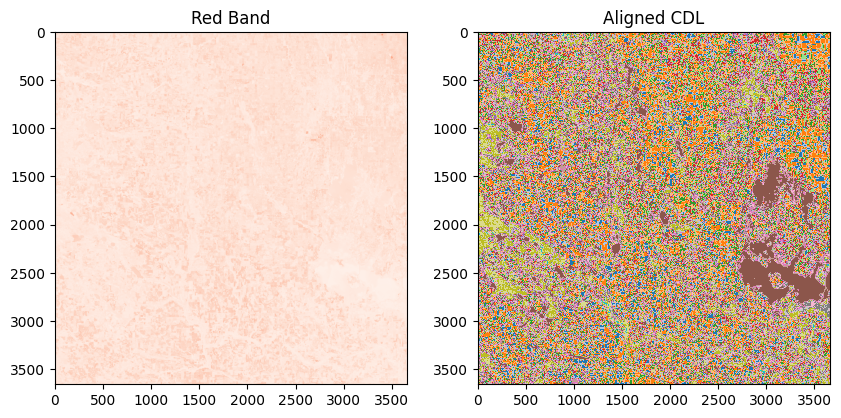

In [15]:
import rasterio
from rasterio.warp import reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt

red_path = "./raw_data/North Dakota/patch2/HLS.S30.T14UMU.2022168T173909.v2.0/B04.tif"
cdl_path = "./cdl_data/North Dakota14/clipped.TIF"

with rasterio.open(red_path) as red_src, rasterio.open(cdl_path) as cdl_src:
    print("Red shape:", red_src.shape)
    print("CDL shape:", cdl_src.shape)
    print("CRS match:", red_src.crs == cdl_src.crs)

    # Allocate destination array
    dst_cdl = np.zeros(red_src.shape, dtype=cdl_src.dtypes[0])

    reproject(
        source=rasterio.band(cdl_src, 1),
        destination=dst_cdl,
        src_transform=cdl_src.transform,
        src_crs=cdl_src.crs,
        dst_transform=red_src.transform,
        dst_crs=red_src.crs,
        dst_resolution=(red_src.res[0], red_src.res[1]),
        resampling=Resampling.nearest
    )


    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(red_src.read(1), cmap='Reds')
    axs[0].set_title("Red Band")

    axs[1].imshow(dst_cdl, cmap='tab20')
    axs[1].set_title("Aligned CDL")
    plt.show()


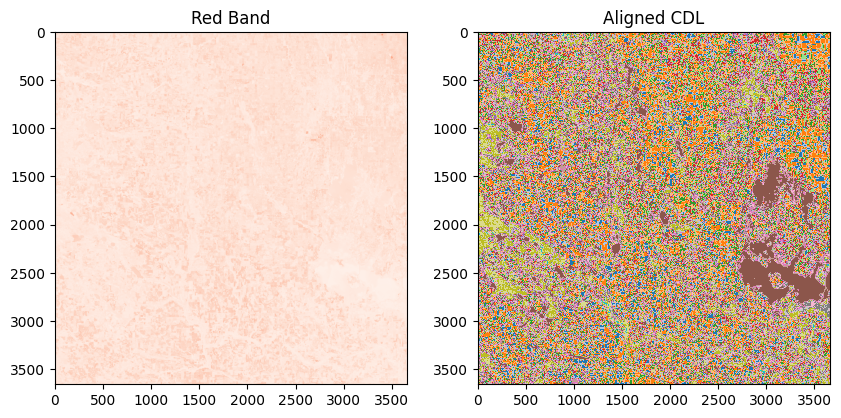

In [9]:
import rasterio

red_path = "./raw_data/North Dakota/patch2/HLS.S30.T14UMU.2022168T173909.v2.0/B04.tif"
cdl_path = "./cdl_data/North Dakota14/clipped.TIF"

with rasterio.open(red_path) as red_src, rasterio.open(cdl_path) as cdl_src:
    
    # 1. Get bounding pixel corners of red band
    red_height, red_width = red_src.shape
    
    # Upper-left and lower-right pixel centers (rasterio uses row, col)
    ul_x, ul_y = red_src.xy(0, 0)  # top-left corner
    lr_x, lr_y = red_src.xy(red_height - 1, red_width - 1)  # bottom-right corner

    # 2. Convert world coordinates to pixel indices in CDL
    row_start, col_start = cdl_src.index(ul_x, ul_y)
    row_end, col_end = cdl_src.index(lr_x, lr_y)

    # Ensure correct order (sometimes y-axis is flipped)
    row_min = min(row_start, row_end)
    row_max = max(row_start, row_end)
    col_min = min(col_start, col_end)
    col_max = max(col_start, col_end)

    # 3. Read subset of CDL corresponding to red band's extent
    cdl_crop = cdl_src.read(1, window=((row_min, row_max + 1), (col_min, col_max + 1)))


    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(red_src.read(1), cmap='Reds')
    axs[0].set_title("Red Band")
    
    axs[1].imshow(cdl_crop, cmap='tab20')
    axs[1].set_title("Aligned CDL")
    plt.show()


In [16]:
np.array_equal(dst_cdl, cdl_crop)

True

In [7]:
import rasterio

red_path = "./raw_data/North Dakota/patch1/HLS.L30.T13UFP.2022173T174118.v2.0/B04.tif"
cdl_path = "./cdl_data/North Dakota14/clipped.TIF"

with rasterio.open(red_path) as red_src, rasterio.open(cdl_path) as cdl_src:
    print(red_src.crs)

EPSG:32613


In [ ]:
EPSG:32613
EPSG:32614
EPSG:32613

In [2]:
import rasterio

path = "./stacked_data/illinois/patch1_stacked.tif"

with rasterio.open(path) as src:
    data = src.read()

19


In [18]:
data.shape

(19, 3660, 3660)

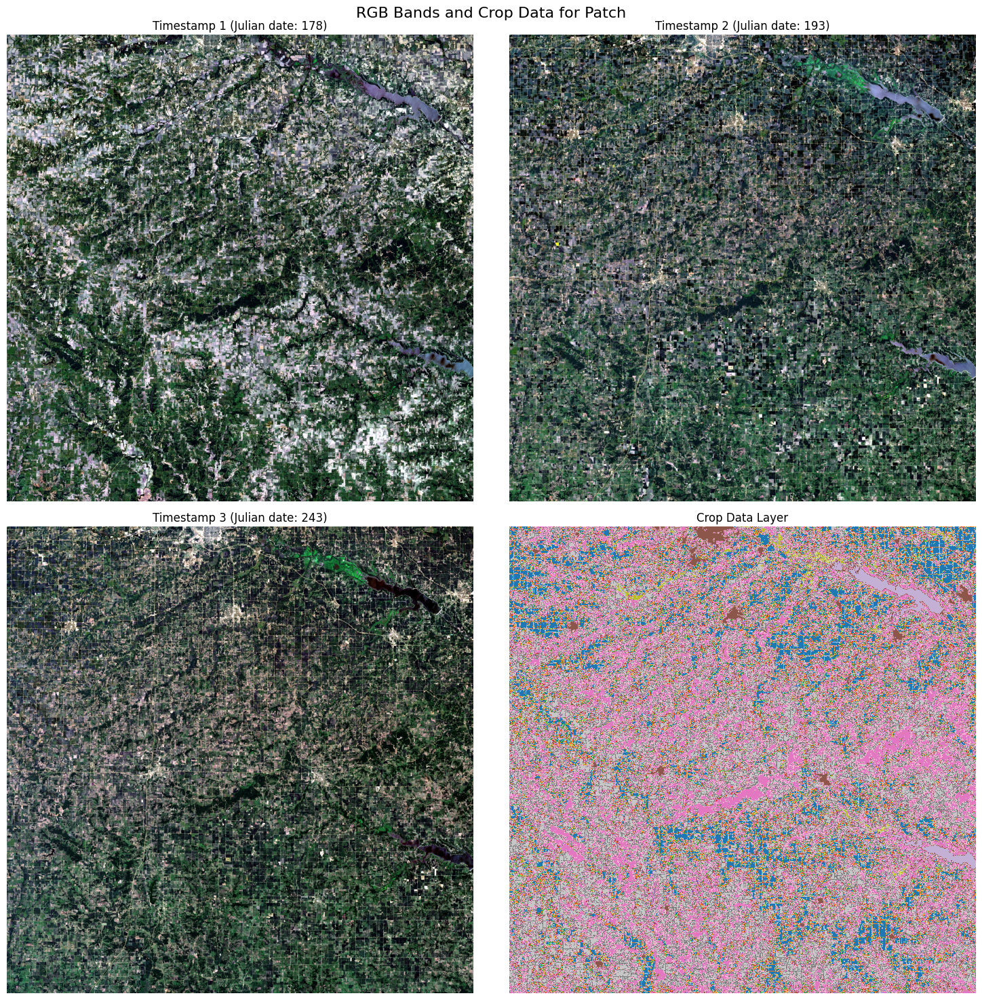

Stacked data shape: (19, 3660, 3660)
Unique crop classes: [  1   4   5  12  21  23  24  26  27  28  36  37  58  59  60  61  68  70
 111 121 122 123 124 131 141 142 143 152 176 190 195 205 225]
Number of unique crop classes: 33

Crop class distribution:
Class 1: 1811459 pixels (13.52%)
Class 4: 336 pixels (0.00%)
Class 5: 2086252 pixels (15.57%)
Class 12: 338 pixels (0.00%)
Class 21: 27 pixels (0.00%)
Class 23: 8 pixels (0.00%)
Class 24: 8527 pixels (0.06%)
Class 26: 40 pixels (0.00%)
Class 27: 899 pixels (0.01%)
Class 28: 16460 pixels (0.12%)
Class 36: 195258 pixels (1.46%)
Class 37: 154369 pixels (1.15%)
Class 58: 311 pixels (0.00%)
Class 59: 193 pixels (0.00%)
Class 60: 53 pixels (0.00%)
Class 61: 651 pixels (0.00%)
Class 68: 1 pixels (0.00%)
Class 70: 2 pixels (0.00%)
Class 111: 260939 pixels (1.95%)
Class 121: 316674 pixels (2.36%)
Class 122: 318198 pixels (2.38%)
Class 123: 86902 pixels (0.65%)
Class 124: 17023 pixels (0.13%)
Class 131: 10483 pixels (0.08%)
Class 141: 2350847 pixe

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
import os
import rasterio


# Function to normalize data for visualization
def normalize_band(band, lower_percentile=2, upper_percentile=98):
    """Normalize band data for visualization using percentiles"""
    min_val = np.percentile(band, lower_percentile)
    max_val = np.percentile(band, upper_percentile)
    normalized = np.clip((band - min_val) / (max_val - min_val), 0, 1)
    return normalized

# Function to create RGB composite
def create_rgb_composite(red_band, green_band, blue_band, lower_percentile=2, upper_percentile=98):
    """Create RGB composite from three bands"""
    r = normalize_band(red_band, lower_percentile, upper_percentile)
    g = normalize_band(green_band, lower_percentile, upper_percentile)
    b = normalize_band(blue_band, lower_percentile, upper_percentile)
    return np.dstack((r, g, b))

# Function to plot crop data with custom colormap
def plot_crop_data(crop_data, ax, title="Crop Data Layer"):
    """Plot crop data with a custom colormap"""
    # Create a custom colormap for crop data
    # This is a simplified version - you might want to customize based on your crop classes
    cmap = plt.cm.tab20
    norm = mcolors.Normalize(vmin=np.min(crop_data), vmax=np.max(crop_data))
    
    im = ax.imshow(crop_data, cmap=cmap, norm=norm)
    ax.set_title(title)
    ax.axis('off')
    
    # Add a colorbar
    # cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.01)
    # cbar.set_label('Crop Class')
    
    return im


path = "./stacked_data/iowa/patch1_stacked.tif"

with rasterio.open(path) as src:
    stacked_data = src.read()

# stacked_data = stacked_data[:, 75:100, 75:100]
    
# # Load the stacked data
# patch_path = "processed_data/illinois/patch1"  # Change this to your patch path
# stacked_data_path = os.path.join(patch_path, "all_bands_stacked.npy")
# metadata_path = os.path.join(patch_path, "metadata.txt")

# Load the stacked data
# stacked_data = np.load(stacked_data_path)

# Extract RGB bands for each timestamp
# Based on the metadata, bands are organized as:
# B02 (Blue), B03 (Green), B04 (Red) for each timestamp

# Timestamp 1 (index 0-5)
rgb1 = create_rgb_composite(
    stacked_data[2],  # B04 (Red)
    stacked_data[1],  # B03 (Green)
    stacked_data[0]   # B02 (Blue)
)

# Timestamp 2 (index 6-11)
rgb2 = create_rgb_composite(
    stacked_data[8],  # B04 (Red)
    stacked_data[7],  # B03 (Green)
    stacked_data[6]   # B02 (Blue)
)

# Timestamp 3 (index 12-17)
rgb3 = create_rgb_composite(
    stacked_data[14],  # B04 (Red)
    stacked_data[13],  # B03 (Green)
    stacked_data[12]   # B02 (Blue)
)

# Crop data is the last band (index 18)
crop_data = stacked_data[18]

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle("RGB Bands and Crop Data for Patch", fontsize=16)

# Plot RGB composites for each timestamp
axes[0, 0].imshow(rgb1)
axes[0, 0].set_title("Timestamp 1 (Julian date: 178)")
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb2)
axes[0, 1].set_title("Timestamp 2 (Julian date: 193)")
axes[0, 1].axis('off')

axes[1, 0].imshow(rgb3)
axes[1, 0].set_title("Timestamp 3 (Julian date: 243)")
axes[1, 0].axis('off')

# Plot crop data
plot_crop_data(crop_data, axes[1, 1], "Crop Data Layer")

plt.tight_layout()
plt.show()

# Print some statistics about the data
print(f"Stacked data shape: {stacked_data.shape}")
print(f"Unique crop classes: {np.unique(crop_data)}")
print(f"Number of unique crop classes: {len(np.unique(crop_data))}")

# Optional: Print the crop class distribution
unique, counts = np.unique(crop_data, return_counts=True)
print("\nCrop class distribution:")
for u, c in zip(unique, counts):
    print(f"Class {u}: {c} pixels ({c/crop_data.size*100:.2f}%)")

In [1]:
from utils import calculate_crop_percentages

# Specify a different directory
percentages, counts, total_pixels = calculate_crop_percentages("./stacked_data")

Found 6 stacked data files. Analyzing crop distribution...


Analyzing crop data: 100%|█████████████████████████████████████| 6/6 [00:02<00:00,  2.96it/s]


Crop Distribution Summary:
Total pixels analyzed: 80,373,600
Corn (ID: 1): 13,484,001 pixels (16.78%)
Soybean (ID: 5): 14,030,145 pixels (17.46%)
Spring Wheat (ID: 23): 5,628,240 pixels (7.00%)
Grassland/Pasture (ID: 176): 17,824,953 pixels (22.18%)
Other land cover types: 36.59%


ValueError: too many values to unpack (expected 3)

In [1]:
from data_manager import find_balanced_crop_combination

find_balanced_crop_combination("./training_data/train_patches.npy", [1, 5, 23, 176])

Combination (1,): 193 good patches out of 1074 (17.97%)
Combination (5,): 75 good patches out of 1074 (6.98%)
Combination (23,): 6 good patches out of 1074 (0.56%)
Combination (176,): 168 good patches out of 1074 (15.64%)
Combination (1, 5): 100 good patches out of 1074 (9.31%)
Combination (1, 23): 216 good patches out of 1074 (20.11%)
Combination (1, 176): 493 good patches out of 1074 (45.90%)
Combination (5, 23): 170 good patches out of 1074 (15.83%)
Combination (5, 176): 466 good patches out of 1074 (43.39%)
Combination (23, 176): 262 good patches out of 1074 (24.39%)
Combination (1, 5, 23): 213 good patches out of 1074 (19.83%)
Combination (1, 5, 176): 211 good patches out of 1074 (19.65%)
Combination (1, 23, 176): 605 good patches out of 1074 (56.33%)
Combination (5, 23, 176): 536 good patches out of 1074 (49.91%)
Combination (1, 5, 23, 176): 217 good patches out of 1074 (20.20%)

Best combination: (1, 23, 176)
Number of good patches: 605 out of 1074 (56.33%)


([1, 23, 176],
 np.int64(605),
 {(1,): np.int64(193),
  (5,): np.int64(75),
  (23,): np.int64(6),
  (176,): np.int64(168),
  (1, 5): np.int64(100),
  (1, 23): np.int64(216),
  (1, 176): np.int64(493),
  (5, 23): np.int64(170),
  (5, 176): np.int64(466),
  (23, 176): np.int64(262),
  (1, 5, 23): np.int64(213),
  (1, 5, 176): np.int64(211),
  (1, 23, 176): np.int64(605),
  (5, 23, 176): np.int64(536),
  (1, 5, 23, 176): np.int64(217)})

In [1]:
from data_manager import find_balanced_crop_combination

a,b, c=find_balanced_crop_combination("./training_data/train_patches.npy", [1, 5, 23, 176])

Combination (1,): 193 good patches out of 1074 (17.97%)
Combination (5,): 75 good patches out of 1074 (6.98%)
Combination (23,): 6 good patches out of 1074 (0.56%)
Combination (176,): 168 good patches out of 1074 (15.64%)
Combination (1, 5): 100 good patches out of 1074 (9.31%)
Combination (1, 23): 216 good patches out of 1074 (20.11%)
Combination (1, 176): 493 good patches out of 1074 (45.90%)
Combination (5, 23): 170 good patches out of 1074 (15.83%)
Combination (5, 176): 466 good patches out of 1074 (43.39%)
Combination (23, 176): 262 good patches out of 1074 (24.39%)
Combination (1, 5, 23): 213 good patches out of 1074 (19.83%)
Combination (1, 5, 176): 211 good patches out of 1074 (19.65%)
Combination (1, 23, 176): 605 good patches out of 1074 (56.33%)
Combination (5, 23, 176): 536 good patches out of 1074 (49.91%)
Combination (1, 5, 23, 176): 217 good patches out of 1074 (20.20%)

Best combination: (5, 23, 176)
Percentage of good patches: 49.91%


In [2]:
import numpy as np
from data_manager import find_balanced_crop_combination, create_modified_crop_labels

train_patches = np.load('./training_data/train_patches.npy')
modified_train_patches = create_modified_crop_labels(train_patches, [1, 5, 23, 176])
a,b, c=find_balanced_crop_combination(modified_train_patches, [1, 5, 23, 176])

Combination (1,): 193 good patches out of 1074 (17.97%)
Combination (5,): 75 good patches out of 1074 (6.98%)
Combination (23,): 6 good patches out of 1074 (0.56%)
Combination (176,): 168 good patches out of 1074 (15.64%)
Combination (1, 5): 100 good patches out of 1074 (9.31%)
Combination (1, 23): 216 good patches out of 1074 (20.11%)
Combination (1, 176): 493 good patches out of 1074 (45.90%)
Combination (5, 23): 170 good patches out of 1074 (15.83%)
Combination (5, 176): 466 good patches out of 1074 (43.39%)
Combination (23, 176): 262 good patches out of 1074 (24.39%)
Combination (1, 5, 23): 213 good patches out of 1074 (19.83%)
Combination (1, 5, 176): 211 good patches out of 1074 (19.65%)
Combination (1, 23, 176): 605 good patches out of 1074 (56.33%)
Combination (5, 23, 176): 536 good patches out of 1074 (49.91%)
Combination (1, 5, 23, 176): 217 good patches out of 1074 (20.20%)

Best combination: (5, 23, 176)
Percentage of good patches: 49.91%


In [2]:
import numpy as np
from data_manager import find_balanced_crop_combination, create_modified_crop_labels

train_patches = np.load('./training_data/train_patches.npy')
modified_train_patches = create_modified_crop_labels(train_patches, [1, 5, 23, 176])
a,b,c = find_balanced_crop_combination(modified_train_patches, [1, 5, 23, 176])

Combination (1,): 193 good patches out of 1074 (17.97%)
Combination (5,): 75 good patches out of 1074 (6.98%)
Combination (23,): 6 good patches out of 1074 (0.56%)
Combination (176,): 168 good patches out of 1074 (15.64%)
Combination (1, 5): 100 good patches out of 1074 (9.31%)
Combination (1, 23): 216 good patches out of 1074 (20.11%)
Combination (1, 176): 493 good patches out of 1074 (45.90%)
Combination (5, 23): 170 good patches out of 1074 (15.83%)
Combination (5, 176): 466 good patches out of 1074 (43.39%)
Combination (23, 176): 262 good patches out of 1074 (24.39%)
Combination (1, 5, 23): 213 good patches out of 1074 (19.83%)
Combination (1, 5, 176): 211 good patches out of 1074 (19.65%)
Combination (1, 23, 176): 605 good patches out of 1074 (56.33%)
Combination (5, 23, 176): 536 good patches out of 1074 (49.91%)
Combination (1, 5, 23, 176): 217 good patches out of 1074 (20.20%)

Best combination: (5, 23, 176)
Percentage of good patches: 49.91%


In [5]:
a,b,c=find_balanced_crop_combination(modified_train_patches, important_crops=[5, 23, 176], ignore_crops=[-1, 1])

Combination (5,): 126 good patches out of 1074 (11.73%)
Combination (23,): 119 good patches out of 1074 (11.08%)
Combination (176,): 192 good patches out of 1074 (17.88%)
Combination (5, 23): 192 good patches out of 1074 (17.88%)
Combination (5, 176): 119 good patches out of 1074 (11.08%)
Combination (23, 176): 126 good patches out of 1074 (11.73%)
Combination (5, 23, 176): 0 good patches out of 1074 (0.00%)

Best combination: (176,)
Percentage of good patches: 17.88%


In [6]:
a,b,c=find_balanced_crop_combination(modified_train_patches, important_crops=[1, -1], ignore_crops=[5, 23, 176])

Combination (1,): 110 good patches out of 1074 (10.24%)
Combination (-1,): 110 good patches out of 1074 (10.24%)
Combination (1, -1): 0 good patches out of 1074 (0.00%)

Best combination: (1,)
Percentage of good patches: 10.24%


In [ ]:
filter_balanced_patches(patches, target_crops, crop_band_index=18, 
                           min_ratio=0.4, max_ratio=0.6, ignore_crops=None)

In [1]:
import numpy as np
from data_manager import find_balanced_crop_combination, create_modified_crop_labels, filter_balanced_patches

train_patches = np.load('./training_data/train_patches.npy')
modified_train_patches = create_modified_crop_labels(train_patches, [1, 5, 23, 176])
a,b,c = find_balanced_crop_combination(modified_train_patches, [1, 5, 23, 176])



Combination (1,): 193 good patches out of 1074 (17.97%)
Combination (5,): 75 good patches out of 1074 (6.98%)
Combination (23,): 6 good patches out of 1074 (0.56%)
Combination (176,): 168 good patches out of 1074 (15.64%)
Combination (1, 5): 100 good patches out of 1074 (9.31%)
Combination (1, 23): 216 good patches out of 1074 (20.11%)
Combination (1, 176): 493 good patches out of 1074 (45.90%)
Combination (5, 23): 170 good patches out of 1074 (15.83%)
Combination (5, 176): 466 good patches out of 1074 (43.39%)
Combination (23, 176): 262 good patches out of 1074 (24.39%)
Combination (1, 5, 23): 213 good patches out of 1074 (19.83%)
Combination (1, 5, 176): 211 good patches out of 1074 (19.65%)
Combination (1, 23, 176): 605 good patches out of 1074 (56.33%)
Combination (5, 23, 176): 536 good patches out of 1074 (49.91%)
Combination (1, 5, 23, 176): 217 good patches out of 1074 (20.20%)

Best combination: (5, 23, 176)
Percentage of good patches: 49.91%


In [4]:
filtered_patches, good_indices = filter_balanced_patches(modified_train_patches, a)

Filtered 1074 patches to 536 good patches (49.91%)
